# Drive Setup

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Methods for Comfort


**Run this in browser consle, this will prevent colab from disconnecting**

```
function KeepClicking(){
   console.log("Clicking");
   document.querySelector("colab-toolbar-button#connect").click()
}setInterval(KeepClicking,60000)
```



**Some Methods**

In [0]:
def get_path2audio(**kwargs):
# name, audio_directory and audio_url
  audio_d = None
  if "audio_directory" in kwargs:
      audio_d = kwargs["audio_directory"]
  else:
      print("Please give directory (as string) where to store file, directory will be created automatically if do not exist")
      return
  if audio_d[-1] != "/":
      audio_d = audio_d + '/'
  dir_check(audio_d)
  

  #if len 1 then user passed name
  if "audio_url" in kwargs:
    if "name" in kwargs:
      name_of_file_to_play = kwargs["name"]
      
    else:
      print("Please give name of file, this name will be used for naming downloaded file..no spaces!!")
      return
    
    audio_url = kwargs["audio_url"]
    !wget -O "$audio_d$name_of_file_to_play" "$audio_url"
    
    abs_file_path = audio_d + name_of_file_to_play
    return abs_file_path
  elif len(kwargs) == 2:
    if "name" in kwargs:
      name_of_file_to_play = kwargs["name"]
      
    else:
      print("Please give name of file, this name will be used for naming downloaded file..no spaces!!")
      return
    abs_file_path = audio_d + name_of_file_to_play
    audio_files = getF(audio_d,"files")
    for f in audio_files:
      if f==name_of_file_to_play:
        return abs_file_path
    print("File with given name do not exist!!")
  elif len(kwargs) == 1:
    audio_files = getF(audio_d,"files")
    if len(audio_files)==0:
      print("directory empty!!")
      return
    abs_file_path = audio_d + audio_files[0]
    return abs_file_path + audio_files[0]
  




In [0]:
# Add this code at end of evry code that takes time, this code will play music when code is finished

# # now unzip
# !unzip -uq "$zip_file_path" -d "$where_to_unzip"

# Play sound once finished
from IPython.display import Audio
audio_path = "/content/audio"
name_of_sound = "a.mp3"
audio_url = "http://nl02.mp3pro.xyz/811b85615a78e38a70752/In%20The%20Mood%20For%20Love%20-%20Yumeji%20s%20Theme.mp3"
Audio(get_path2audio(name="a.mp3",audio_directory=audio_path,audio_url=audio_url), autoplay=True)

# Path variables setup

In [0]:
A = "/content/drive/My Drive/DataSets/CUHK_FACE_SKETCHS/absolute_resizing/A/"
B = "/content/drive/My Drive/DataSets/CUHK_FACE_SKETCHS/absolute_resizing/B/"
AB = "/content/drive/My Drive/DataSets/CUHK_FACE_SKETCHS/absolute_resizing/AB/"

**Below write the directory where you want pix2pix to be installed, and trained**

In [0]:
directory_to_install_pix2pix ="/content/drive/My Drive/pix2pix&gcans/"

In [0]:
# this method is defined in Helper Methods cell, it creates directory if it do not exist already
dir_check(directory_to_install_pix2pix)

In [0]:
# /content/drive/My Drive/ROMI/Sketches/RINGED/pix2pix_models
directory_to_install_pix2pix

'/content/drive/My Drive/pix2pix&gcans/'

# Get the pix2pix from repositry

In [6]:
%cd "$directory_to_install_pix2pix"

/content/drive/My Drive/pix2pix&gcans


In [0]:
!pwd

/content/drive/My Drive/pix2pix&gcans


In [0]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2246, done.
remote: Total 2246 (delta 0), reused 0 (delta 0), pack-reused 2246
Receiving objects: 100% (2246/2246), 8.06 MiB | 9.74 MiB/s, done.
Resolving deltas: 100% (1445/1445), done.


# Install

**NOTE** 



```
Even if you previously installed it, and starting a new session having the same paths as previous then you should again install requirements otherwise train.py or test.py will through exception "No module named dominate"
```



In [0]:
import os
os.chdir('/content/drive/My Drive/pix2pix&gcans/pytorch-CycleGAN-and-pix2pix/')

In [8]:
!pip install -r requirements.txt

     |████████████████████████████████| 686kB 19.3MB/s 
     |████████████████████████████████| 204kB 31.8MB/s 
  Created wheel for visdom: filename=visdom-0.1.8.9-cp36-none-any.whl size=655250 sha256=9acede4b66b478dbc19778bd5bf54dc1d6a7ee0ff7439d2571c16fd9e8421514
  Stored in directory: /root/.cache/pip/wheels/70/19/a7/6d589ed967f4dfefd33bc166d081257bd4ed0cb618dccfd62a
  Created wheel for torchfile: filename=torchfile-0.1.0-cp36-none-any.whl size=5712 sha256=d66ede54ff26a88e03106f0bc255a1d755360db36aa1d06b622c02705d0b17e8
  Stored in directory: /root/.cache/pip/wheels/b1/c3/d6/9a1cc8f3a99a0fc1124cae20153f36af59a6e683daca0a0814
Successfully built visdom torchfile


# Datasets

Download one of the official datasets with:

-   `bash ./datasets/download_pix2pix_dataset.sh [cityscapes, night2day, edges2handbags, edges2shoes, facades, maps]`

Or use your own dataset by creating the appropriate folders and adding in the images. Follow the instructions [here](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/docs/datasets.md#pix2pix-datasets).

In [0]:
!bash ./datasets/download_pix2pix_dataset.sh facades

# Helper Methods

**It is better to not have split A and B into train and val manully, instead use some method to randomly distribute images**

In [0]:
import ntpath
from os import walk, path
from pathlib import Path
import random
import shutil,os
import math


# Imports for image plotting
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
%matplotlib inline
import sys



def getF(directory, x="both"):
    # x could be "files" or "folders" or "both"

    if directory[-1] != "/":
      directory += "/"

    folders = []
    for f in walk(directory):
      folders.extend(f)
      # ???

    if x == "folders":
      return folders[1]

      
      
        
    if x == "files":
        return folders[2]
    else:
      return folders[1], folders[2]

      
        


def path_leaf(path):
    head, tail = ntpath.split(path)

    # if name ends with \\ then tail won't return anything
    # return tail or ntpath.basename(head)

    # since you dont want to return in case its not file
    return tail

def dir_check(path):
    Path(path).mkdir(parents=True, exist_ok=True)


def get_uniq_num(lwr_bound, upr_bound, percentage_to_return):
  if percentage_to_return > 100 or percentage_to_return <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")

  
  # in case  number of images to return is not int then it will be rounded to floor

  nums = list(range(lwr_bound, upr_bound+1))
  random.shuffle(nums)

  to_return = []
  count_for_return = math.floor((percentage_to_return*len(nums))/100)

  for i in range( count_for_return ):
    to_return.append(nums[i])
  return to_return



def get_shuffled_file_names(source, percentage_of_file_needed):

  if percentage_of_file_needed > 100 or percentage_of_file_needed <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")

  fil = getF(source,"files")
  # Note 1 in lwr bound, cause if i == 0 then fil[i-1] will give last elemnet
  ids = get_uniq_num(0+1,len(fil),percentage_of_file_needed)

  ids.sort()
  needed = [fil[i-1] for i in ids ]

  return needed

def move_data(list_of_file_name, source, destination):
  if destination[-1] != "/":
    destination += "/"
  
  if source[-1] != "/":
    source += "/"
  

  dir_check(destination)
  for f in list_of_file_name:
    shutil.move( source + f, destination)



def split_store2train_test(A, B, percentage_of_test):

  if percentage_of_test > 100 or percentage_of_test <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")

  names = get_shuffled_file_names(A,percentage_of_test)

    


  move_data ( names, A, A + "/test" )
  move_data ( names, B, B + "/test" )

  remain_files = getF( A, "files" )

  move_data ( remain_files, A, A + "/train" )
  move_data ( remain_files, B, B + "/train" )

  print( "Success!\n" + str(len(names)) +" files moved to test\n" + str(len(remain_files)) + " files moved to train")

def show_imgs(path2imgs, percentage2show, imgs2show_per_row):
  if percentage2show > 100 or percentage2show <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")
    return

  if path2imgs[-1] != "/":
      path2imgs += "/"

  imgs = get_shuffled_file_names(path2imgs, percentage2show)
  print("Images: "+str(len(imgs)))
  # # ???
  # #figure size in inches optional

  
  rcParams['figure.figsize'] = 11 ,8
  imgs_left = len(imgs)

  

  # upr bound is fit
  # jump fit
  # print("bound: "+ str(math.ceil(len(imgs)/imgs2show_per_row)+imgs2show_per_row))
  print("Total Images: "+str(len(imgs)))
  print("bound: " + str(len(imgs)))
  for i in range(0, len(imgs), imgs2show_per_row):
    # print("outer_loop: "+str(i))
    
    if imgs_left >= imgs2show_per_row:
      # 1 row and imgs2show_per_row cols
      figure, axes = plt.subplots(1, imgs2show_per_row)

    else:
      figure, axes = plt.subplots(1, imgs_left)
      imgs2show_per_row = imgs_left
   
   
    for j in range(imgs2show_per_row):
        
        axes[j].imshow( mpimg.imread( path2imgs +  str(imgs[i+j]), 0 ) );
        axes[j].set_title(str(imgs[i+j]))
    
    imgs_left -= imgs2show_per_row
    print("imgs left: "+str(imgs_left))
    

    
    
    

  





def show_pair( A, B, percentage_to_return ):
  if percentage_to_return > 100 or percentage_to_return <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")
  if A[-1] != "/":
    A += "/"
  if B[-1] != "/":
    B += "/"
  # fold = getF( A, "folders" )

  test_dir_A = A + "test/"
  train_dir_A = A + "train/"

  

  test_dir_B = B + "test/"
  train_dir_B = B + "train/"

  files_test = getF( test_dir_A, "files")
  files_train = getF( train_dir_A, "files")




  count4test = math.floor((percentage_to_return*len(files_test))/100)
  count4train = math.floor((percentage_to_return*len(files_train))/100)


  
  file_names_test = get_shuffled_file_names( test_dir_A , 100 )
  file_names_train = get_shuffled_file_names( train_dir_A, 100 )

  # figure size in inches optional
  rcParams['figure.figsize'] = 11 ,8



 
  # For test images
  for i in range(count4test):
    # read images
    # Note if you dont give 0 as second parameter then for corrupt header PNG
    #  files, plt will through error, for others will display yelloish img
    fig, axes = plt.subplots(1,2)
    img_A = mpimg.imread( test_dir_A + str(file_names_test[i]), 0 )
    img_B = mpimg.imread( test_dir_B + str(file_names_test[i]), 0 ) 
    

    # display images
    
    axes[0].imshow(img_A);
    axes[1].imshow(img_B);

    axes[0].set_title("test_A: "+str(file_names_test[i]))
    axes[1].set_title("test_B: "+str(file_names_test[i]))

    
  
  # For test images
  for i in range(count4train):
    # read images
    # Note if you dont give 0 as second parameter then for corrupt header PNG
    #  files, plt will through error, for others will display yelloish img
    fig, axes = plt.subplots(1,2)
    img_A = mpimg.imread( train_dir_A + str(file_names_train[i]), 0 )
    img_B = mpimg.imread( train_dir_B + str(file_names_train[i]), 0 ) 


    # display images
    # fig, axes = plt.subplots(1,2)
    axes[0].imshow(img_A);
    axes[1].imshow(img_B);

    axes[0].set_title("train_A: "+str(file_names_train[i]))
    axes[1].set_title("train_B: "+str(file_names_train[i]))




# temp method for seeing results.
# change it and randomly select triplets, make sure about triplets
def show_imgs2(path2imgs, percentage2show, imgs2show_per_row):
  if percentage2show > 100 or percentage2show <= 0:
    print("Invalid second argument!!\nPercentage should be 1-100")

  if path2imgs[-1] != "/":
      path2imgs += "/"


  imgs = getF(path2imgs, "files")
  total_imgs = math.floor((percentage2show*len(imgs))/100)

  #figure size in inches optional
  rcParams['figure.figsize'] = 11 ,8

  for i in range(0, total_imgs-imgs2show_per_row, imgs2show_per_row):

    # 1 row and imgs2show_per_row cols
    figure, axes = plt.subplots(1, imgs2show_per_row)

    # fill row
    for j in range(imgs2show_per_row):
      axes[j].imshow( mpimg.imread( path2imgs +  str(imgs[i+j]), 0 ) );
      axes[j].set_title(str(imgs[i+j]))






# split A and B and Move to their folders

**If you have images in A and B and not in their respective test train folders, then split them and move images to corresponding path**

In [0]:
# split_store2train_test takes A and B which are not yet divided into train and test and
# randomly splits them into test and train automatically
# the third argument it take is percentage of entire data you want to give to test set
split_store2train_test(A,B,20)

Success!
20 files moved to test
80 files moved to train


# Inspect splitted images





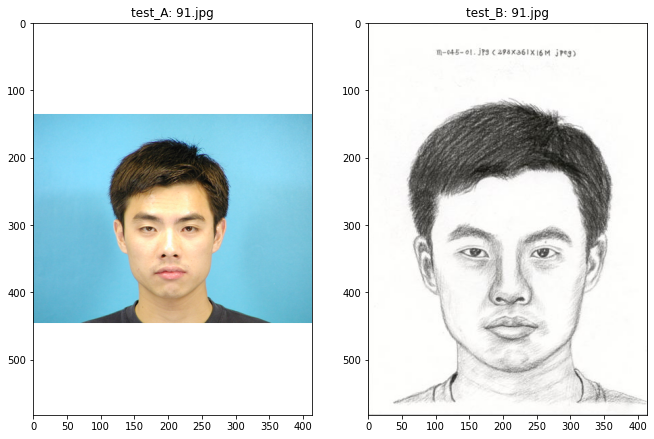

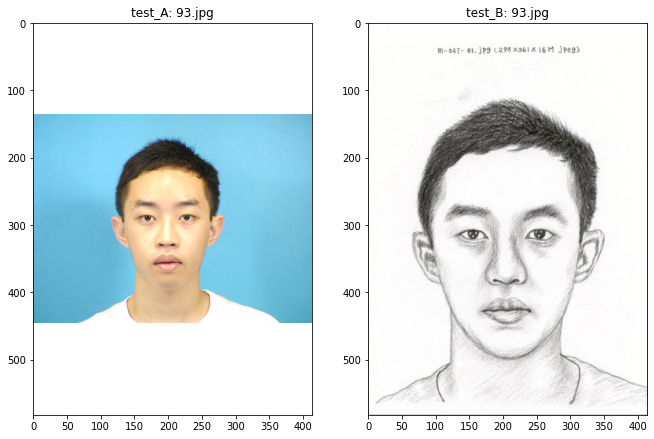

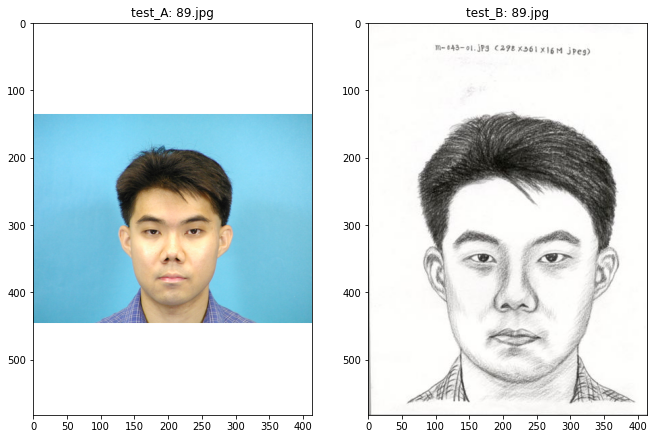

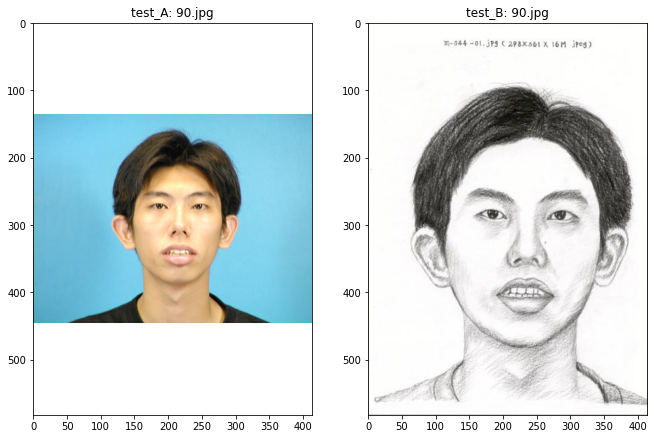

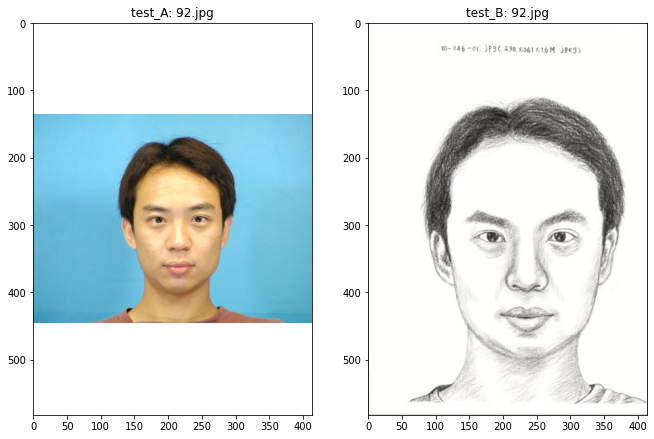

...

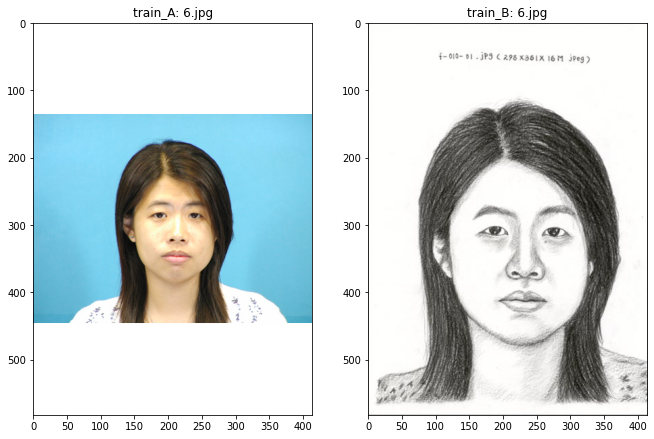

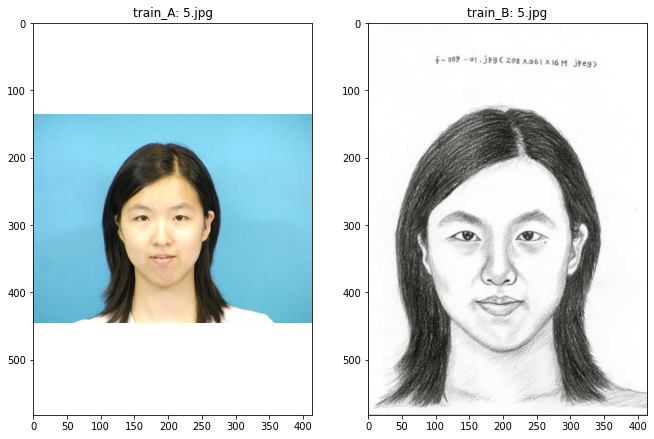

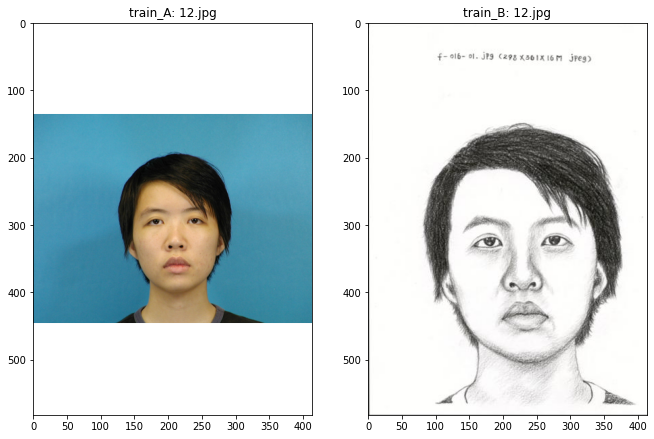

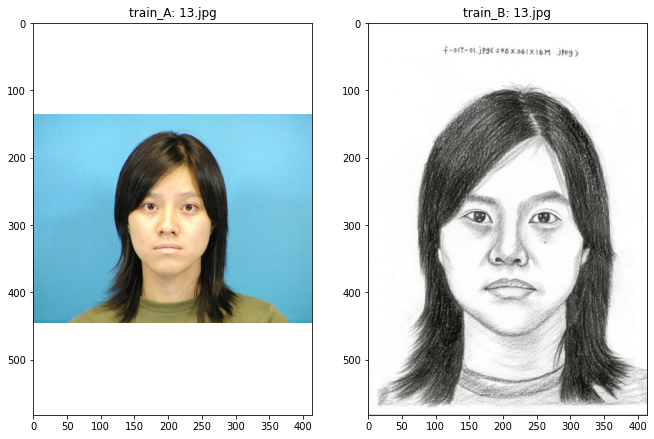

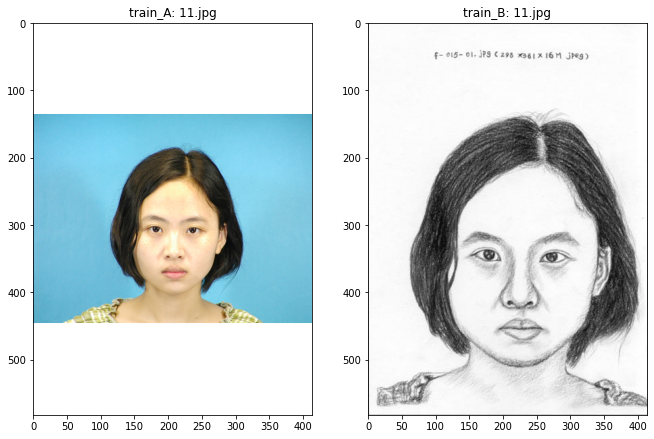

In [0]:
# show_pair() takes path to A and B and percentage of test and train images to display as pairs of A and B

show_pair(A, B, 10)

# combine_A_and_B

In [0]:
# test paths
print(A)
print(B)
print(AB)

/content/drive/My Drive/ROMI/Sketches/RINGED/data/A/
/content/drive/My Drive/ROMI/Sketches/RINGED/data/B/
/content/drive/My Drive/ROMI/Sketches/RINGED/data/AB/


**After --folder_A write address of "A" of your dataset**

**After --folder_B write address of "B" of your dataset**



---



**After --folder_AB write address where you want "AB" of to be created**

***NOTE:***

 to pass variable to shell script use double quotaion ***"*** and **$**

In [0]:
!python3 datasets/combine_A_and_B.py --fold_A "$A" --fold_B "$B" --fold_AB "$AB"





# # now unzip
# !unzip -uq "$zip_file_path" -d "$where_to_unzip"

# Play sound once finished
from IPython.display import Audio
audio_path = "/content/audio"
name_of_sound = "a.mp3"
audio_url = "http://nl02.mp3pro.xyz/811b85615a78e38a70752/In%20The%20Mood%20For%20Love%20-%20Yumeji%20s%20Theme.mp3"
Audio(get_path2audio(name="a.mp3",audio_directory=audio_path,audio_url=audio_url), autoplay=True)

[fold_A] =  /content/drive/My Drive/ROMI/Sketches/RINGED/data/A/
[fold_B] =  /content/drive/My Drive/ROMI/Sketches/RINGED/data/B/
[fold_AB] =  /content/drive/My Drive/ROMI/Sketches/RINGED/data/AB/
[num_imgs] =  1000000
[use_AB] =  False
split = test, use 20/20 images
split = test, number of images = 20
split = train, use 80/80 images
split = train, number of images = 80
--2020-06-09 15:36:08--  http://nl02.mp3pro.xyz/811b85615a78e38a70752/In%20The%20Mood%20For%20Love%20-%20Yumeji%20s%20Theme.mp3
Resolving nl02.mp3pro.xyz (nl02.mp3pro.xyz)... 51.15.103.84
Connecting to nl02.mp3pro.xyz (nl02.mp3pro.xyz)|51.15.103.84|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5886674 (5.6M) [audio/mpeg]
Saving to: ‘/content/audio/a.mp3’

/content/audio/a.mp 100%[===================>]   5.61M  1.14MB/s    in 4.9s    

2020-06-09 15:36:14 (1.14 MB/s) - ‘/content/audio/a.mp3’ saved [5886674/5886674]



# Inspect combined images

Images: 14
Total Images: 14
bound: 14
imgs left: 12
imgs left: 10
imgs left: 8
imgs left: 6
imgs left: 4
imgs left: 2
imgs left: 0


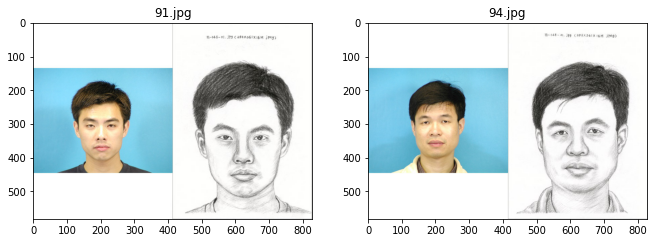

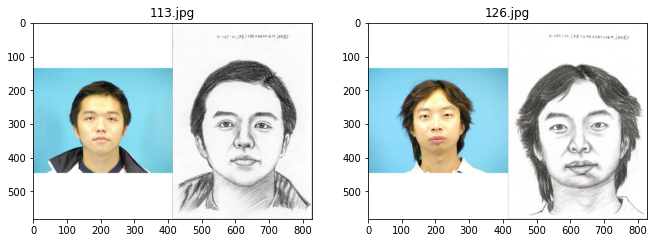

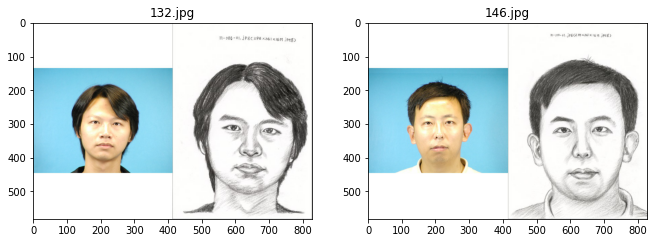

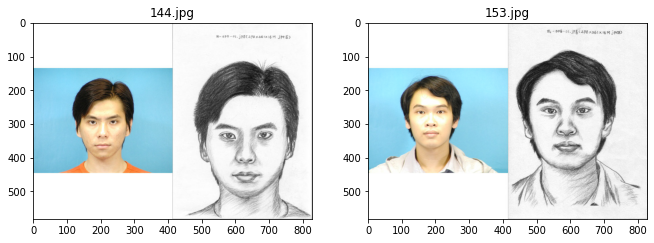

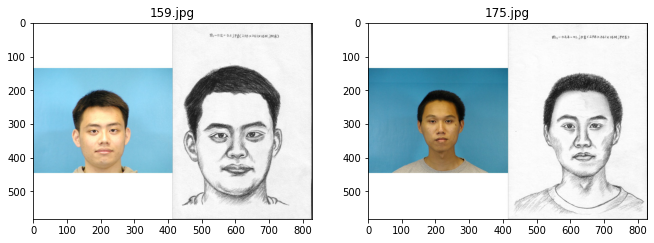

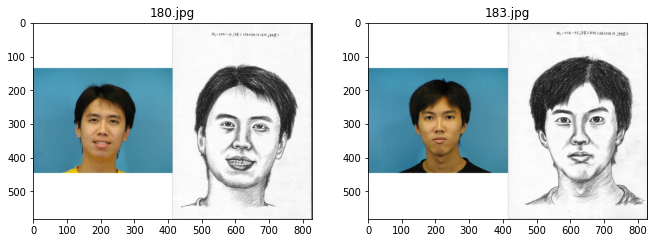

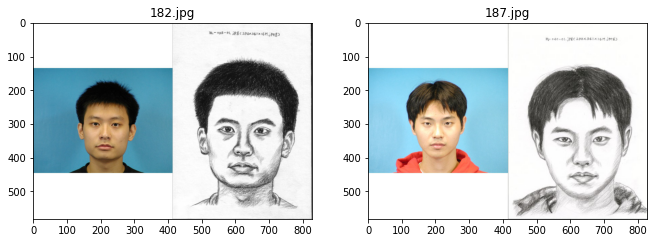

In [0]:
# show_images() takes three arguments
# path whose images to display, 
# second argument is percentage of total images to display
# third argument is number of images to display in one row

path2combined_images = AB+"/test/"
show_imgs( path2combined_images , 14, 2)

Images: 13
Total Images: 13
bound: 13
imgs left: 11
imgs left: 9
imgs left: 7
imgs left: 5
imgs left: 3
imgs left: 1


TypeError: ignored

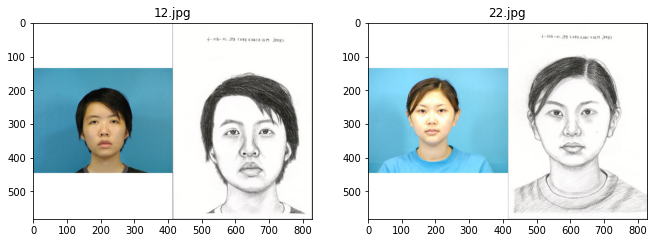

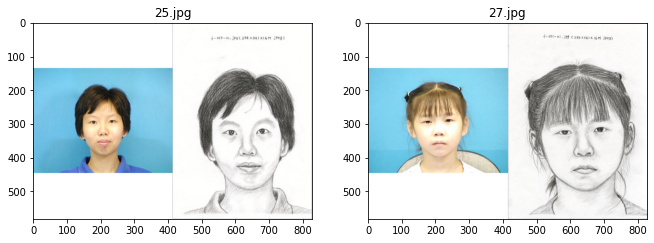

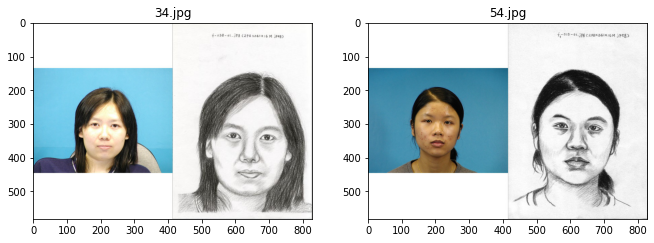

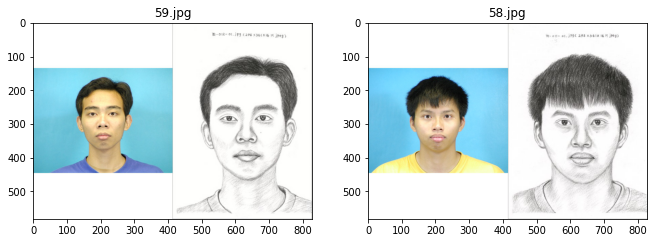

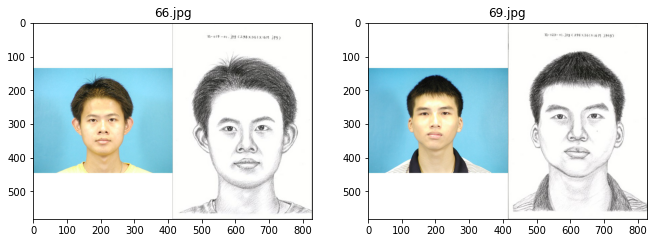

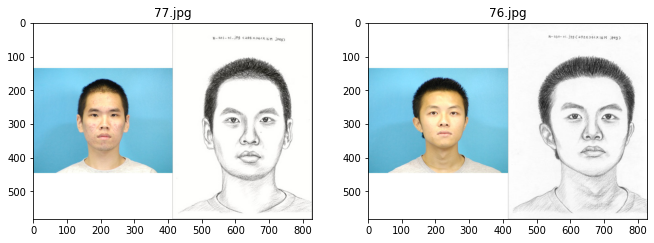

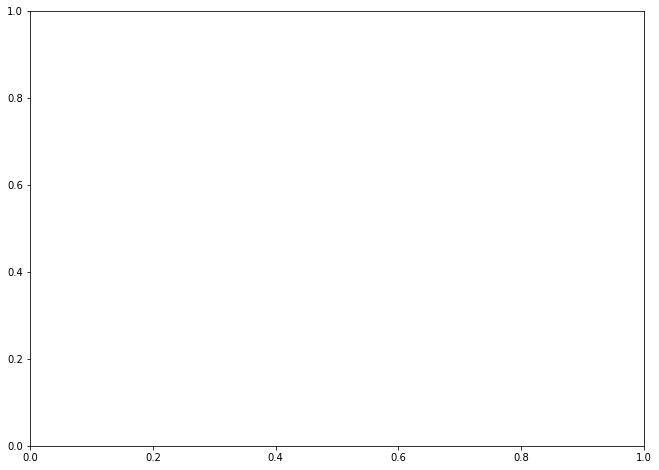

In [0]:
# show_images() takes path whose images to display

show_imgs(AB+"/train/", 15, 2)

**If you not using your own dataset, then download datasets using below code.**

# Pretrained models

Download one of the official pretrained models with:

-   `bash ./scripts/download_pix2pix_model.sh [edges2shoes, sat2map, map2sat, facades_label2photo, and day2night]`

Or add your own pretrained model to `./checkpoints/{NAME}_pretrained/latest_net_G.pt`

In [0]:
!bash ./scripts/download_pix2pix_model.sh edges2shoes

Note: available models are edges2shoes, sat2map, map2sat, facades_label2photo, and day2night
Specified [edges2shoes]
for details.

--2020-05-28 12:14:53--  http://efrosgans.eecs.berkeley.edu/pix2pix/models-pytorch/edges2shoes.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.189.73
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.189.73|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 217704688 (208M)
Saving to: ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’

./checkpoints/edges 100%[===================>] 207.62M  20.3MB/s    in 11s     

2020-05-28 12:15:05 (18.4 MB/s) - ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’ saved [217704688/217704688]



# Training

-   `python train.py --dataroot ./datasets/facades --name facades_pix2pix --model pix2pix --direction BtoA`

Change the `--dataroot` and `--name` to your own dataset's path and model's name. Use `--gpu_ids 0,1,..` to train on multiple GPUs and `--batch_size` to change the batch size. Add `--direction BtoA` if you want to train a model to transfrom from class B to A.

**Dataroot is the place from where model will fetch data which is the form of AB, A and B attached**

**To save different runs of the same model differently use some dynamic naming system (like using timestamp) after --name**

datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S') will return unique folder name each time

**Understand the directories:**

1) at start you used %cd command to whatever the directory you wanted to install pytorch in (or clone cycleGan repository)

2) whenever you run model, provide name for this run via **--name**, this name will be used to create separate folder for results for each run and to store trained model with separate name, in case you might need previous models

2) this CycleGan folder have many folder, important for you are:

      results     :  stores results, one folder per model run, if changed model name each time you ran the model , **CREATED WHEN YOU RUN test.py**
      checkpoints :  stores models one folder per model run, if changed model name each time you ran the model


In [0]:
# below code will list all the options (hyperparameter) you can control while calling train.py
!python train.py -h

In [0]:
# if connection dropped then reload model and do traing from last checkpoint
!python train.py --dataroot "$AB" --name cuhk_face_created_2020-06-12-12-22-57 --model pix2pix --direction BtoA --continue_train --epoch_count 885 --epoch 'latest' --n_epochs 139  --n_epochs_decay 1400  --ndf 64 --netG 'unet_256' --norm 'batch' --lr 0.0002


In [0]:
import time
timestr = time.strftime("%Y-%m-%d-%H-%M-%S")
model_name = "cuhk_face_created_"+timestr


!python train.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction BtoA --beta1 0.5 --n_epochs 139  --n_epochs_decay 1400 --ndf 64 --netG 'unet_256' --norm 'batch' --lr 0.0002
# !python train.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction AtoB --n_epochs 139  --n_epochs_decay 800 --batch_size 5 --input_nc 1 --output_nc 1 --ndf 64 --netG 'unet_256' --norm 'batch'
# !python train.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction AtoB --n_epochs 150 --n_epochs_decay 163 --batch_size 5  --ndf 64 --netG 'unet_256' --norm 'batch'


# becuase of preprocess=none
# !python train.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction AtoB --n_epochs 200 --n_epochs_decay 163 --batch_size 5 --input_nc 1 --output_nc 1 --ndf 64 --netG 'unet_256' --norm 'batch' --preprocess 'none'
# RuntimeError: stack expects each tensor to be equal size, but got [1, 168, 308] at entry 0 and [1, 72, 100] at entry 1


# becuase of preprocess=none
# !python train.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction AtoB --n_epochs 200 --n_epochs_decay 163  --input_nc 1 --output_nc 1 --ndf 64 --netG 'unet_256' --preprocess 'none'
# ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 512, 1, 1])

# # now unzip
# !unzip -uq "$zip_file_path" -d "$where_to_unzip"

# # Play sound once finished
# from IPython.display import Audio
# audio_path = "/content/audio"
# name_of_sound = "a.mp3"
# audio_url = "http://nl02.mp3pro.xyz/811b85615a78e38a70752/In%20The%20Mood%20For%20Love%20-%20Yumeji%20s%20Theme.mp3"
# Audio(get_path2audio(name="a.mp3",audio_directory=audio_path,audio_url=audio_url), autoplay=True)

In [0]:
model_name

'cuhk_face_created_2020-06-12-08-35-49'

# Testing

-   `python test.py --dataroot ./datasets/facades --direction BtoA --model pix2pix --name facades_pix2pix`

Change the `--dataroot`, `--name`, and `--direction` to be consistent with your trained model's configuration and how you want to transform images.

> from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix:
> Note that we specified --direction BtoA as Facades dataset's A to B direction is photos to labels.

> If you would like to apply a pre-trained model to a collection of input images (rather than image pairs), please use --model test option. See ./scripts/test_single.sh for how to apply a model to Facade label maps (stored in the directory facades/testB).

> See a list of currently available models at ./scripts/download_pix2pix_model.sh

In [0]:
# Note: in case running test after a different session then the one where you trained, then provide model name again.

model_name = "cuhk_face_created_2020-06-12-12-22-57"

In [0]:

!python test.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction BtoA
# --ndf 64 --netG 'unet_256' --norm 'batch'

# !python test.py --dataroot "$AB" --name "$model_name" --model pix2pix --direction AtoB





# # now unzip
# !unzip -uq "$zip_file_path" -d "$where_to_unzip"

# Play sound once finished
# from IPython.display import Audio
# audio_path = "/content/audio"
# name_of_sound = "a.mp3"
# audio_url = "http://nl02.mp3pro.xyz/811b85615a78e38a70752/In%20The%20Mood%20For%20Love%20-%20Yumeji%20s%20Theme.mp3"
# Audio(get_path2audio(name="a.mp3",audio_directory=audio_path,audio_url=audio_url), autoplay=True)

# Visualize

**Path setup**

In [0]:
result_imgs_dir = ""

if directory_to_install_pix2pix[-1] != "/":
    directory_to_install_pix2pix += "/"

result_imgs_dir = directory_to_install_pix2pix + "pytorch-CycleGAN-and-pix2pix/" \
 + "results/" +model_name + "/" + "test_latest/"  + "images"







In [0]:
result_imgs_dir

'/content/drive/My Drive/pix2pix&gcans/pytorch-CycleGAN-and-pix2pix/results/cuhk_face_created_2020-06-12-08-35-49/test_latest/images'

**Show images**

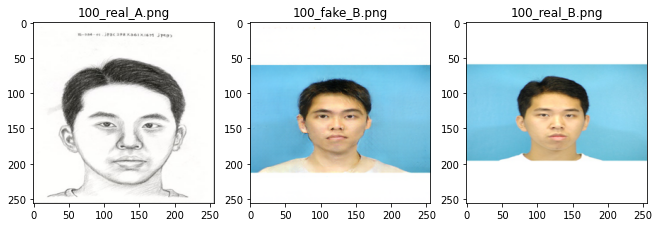

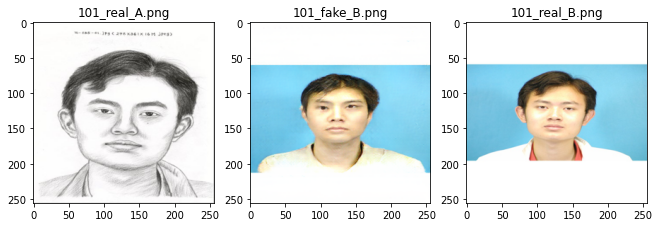

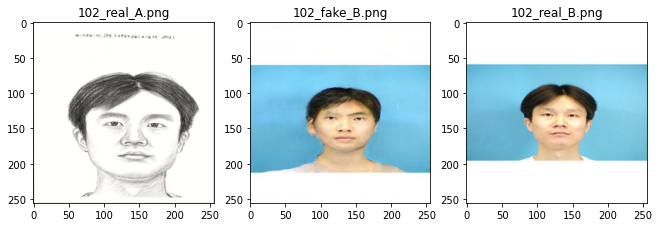

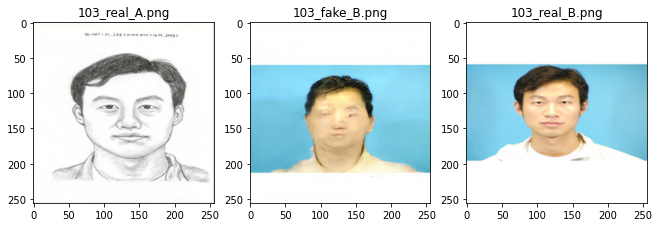

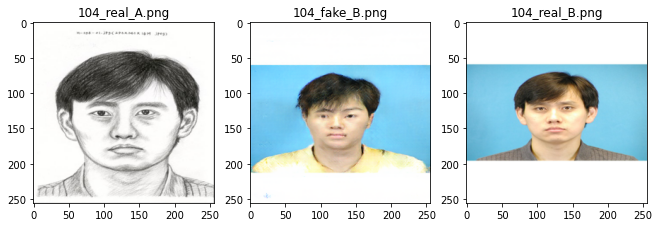

...

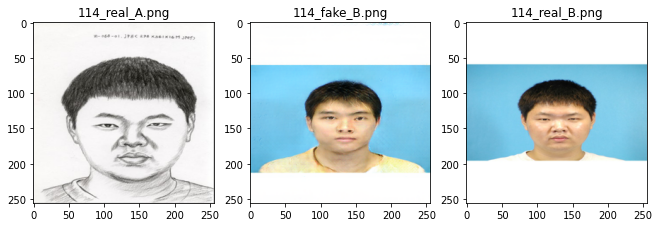

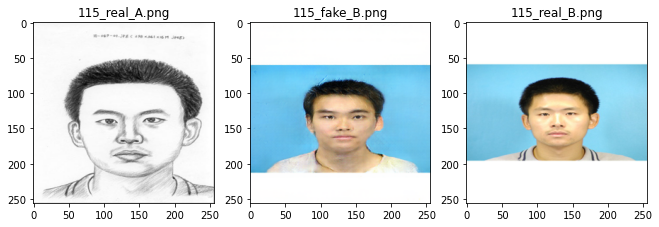

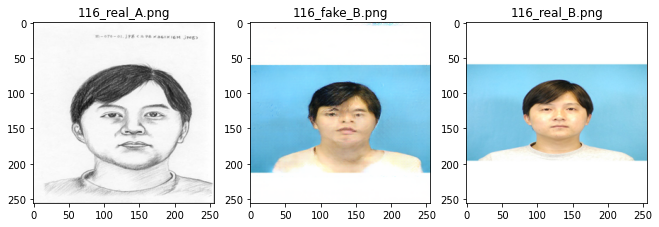

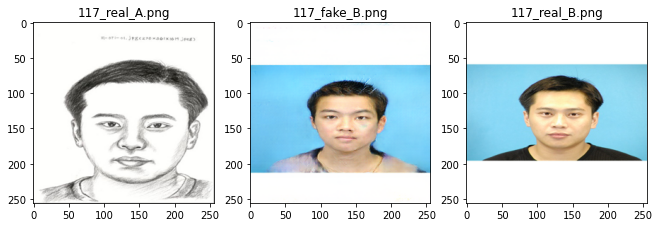

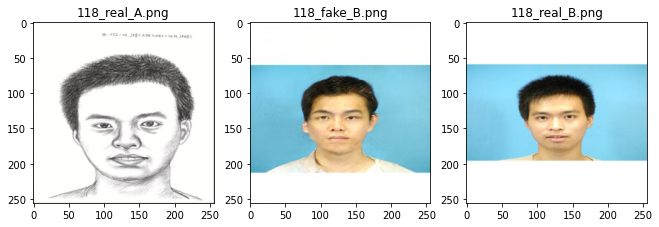

In [14]:
# As result have 3 images, real_A, real_B, fake
# and they are in order, one after the other..

# so call show_imgs() with random_select = False
# and show 3 images per row




# temp method for seeing results.
# change it and randomly select triplets, make sure about triplets
show_imgs2(result_imgs_dir+"/",40, 3)